In [1]:
import tweepy
import webbrowser
import networkx as nx
import time
import pandas as pd
import csv
import operator
import json
import community as community_louvain
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import collections

### Data Collection

In [2]:
F_NAME = 'retweet_data.json'

tweets_read = 0
edge_list   = []
retweet_id_list = []
with open(F_NAME,'r') as f:
    for result in f:
        #print(result)
        tweet = json.loads(result)
        tweets_read += 1
        if tweet.get('retweeted_status'): #B->A (tweets of A that user(B) retweeted)
            user    = tweet['user']['screen_name']
            rt_user = tweet['retweeted_status']['user']['screen_name']
            edge_list.append((user, rt_user))
            retweet_id_list.append(tweet.get('id'))
print(tweets_read, len(edge_list))

1911 1911


In [3]:
consumer_key = '4VANzSEBgOaGefu8GIHVCKY8U'
consumer_secret = 'iIwXQJEqzlAAuOBl4toy05ngf94hu6HpqM96CbuCqgxT8c7mJy'

In [4]:
callback_url = 'oob'

In [5]:
auth = tweepy.OAuthHandler(consumer_key, consumer_secret, callback_url)

In [6]:
redirect_url = auth.get_authorization_url()
print(redirect_url)
webbrowser.open(redirect_url)

https://api.twitter.com/oauth/authorize?oauth_token=yt8HlwAAAAABOqGjAAABeS4Ck2A


True

In [7]:
user_pin_input = input('Enter pin ')

Enter pin 1027932


In [8]:
auth.get_access_token(user_pin_input)

('1380915825268301830-XhRGG6DsXtRtwqW4xDvhuHJNlwovYF',
 'malyBIy1wetuhKD8SaztDD8E49LBeqNdW4JCLCUKBX3Zv')

In [9]:
api = tweepy.API(auth, wait_on_rate_limit=True, wait_on_rate_limit_notify=True, compression=True)

In [3]:
#A->B (Users who retweeted the posts by B)
df = pd.read_csv('./tweet_dataset.csv')
len(df)

7000

In [4]:
retweet_id_list_user = []
for index, row in df.iterrows():
    if(row['id'] not in retweet_id_list): #only original tweet or quoted tweet's retweets can be computed
        #print(row)
        retweet_id_list_user.append((row['id'], row['retweet_count'], row['author']))

In [5]:
retweet_id_list_user = sorted(retweet_id_list_user, key = lambda x: x[1], reverse=True)

In [6]:
print(len(retweet_id_list_user))
print(retweet_id_list_user[:10])

5089
[(1297767023657619457, 19810, 'MamataOfficial'), (1385128073218060295, 8664, 'SitaramYechury'), (1385779864649691136, 8312, 'MahuaMoitra'), (1297767021736673280, 7614, 'MamataOfficial'), (1363337309077168128, 7185, 'MahuaMoitra'), (1359034355360825345, 7174, 'MahuaMoitra'), (1386387515884466176, 6614, 'MahuaMoitra'), (1367117209647017989, 6376, 'MahuaMoitra'), (1381620737262321684, 6306, 'MamataOfficial'), (1385415305514520576, 6306, 'MahuaMoitra')]


In [170]:
cnt = 0
edge_list_new = []
FILE = './retweet_network_C_B_edge_2.csv'
f = open(FILE, 'w')
writer = csv.writer(f)
writer.writerow(['Source', 'Target'])

for (id,rc,author) in retweet_id_list_user:
    #try:
#     for retweeters in tweepy.Cursor(api.retweets, id=id,
#                                   skip_status=True, include_user_entities=False).items(10):
#         edge_list_new.append((retweeters.screen_name, author))
#     except:
#         print("Failed to run command ...")
    try:
        retweeters = api.retweets(id, count=10)
        for rt_user in retweeters:
            #print(rt_user)
            edge_list_new.append((rt_user.user.screen_name, author))
            writer.writerow([rt_user.user.screen_name, author])
    except:
        print("Failed to run command ...")
    if(cnt == 500):
        break
    cnt+=1
    
f.close()

Rate limit reached. Sleeping for: 317
Rate limit reached. Sleeping for: 837
Rate limit reached. Sleeping for: 840
Rate limit reached. Sleeping for: 843
Rate limit reached. Sleeping for: 845
Rate limit reached. Sleeping for: 847


In [7]:
#users (set B)
B = []
for edge in edge_list:
    B.append(edge[0])
B = set(B) #take unique
#identify set A (whom users(B) retweet) - take from edge_list
A = []
for edge in edge_list:
    A.append(edge[1])
A = set(A) #take unique
#identify set C (who retweet users(B) ) - take from edge_list_new 
df = pd.read_csv('./retweet_network_C_B_edge_2.csv')
C = []
for index, row in df.iterrows():
    C.append(row['Source'])
C = set(C) # take unique

In [8]:
print("Number of users whom B retweet:", len(A))
print("Number of users who retweet B:", len(C))
print("Number of users in Set B", len(B))

Number of users whom B retweet: 371
Number of users who retweet B: 2195
Number of users in Set B 14


In [20]:
#make set A1 and A2
FILE_A1 = './retweet_network_A1_copy.csv'
FILE_A2 = './retweet_network_A2.csv'
f1 = open(FILE_A1, 'w')
f2 = open(FILE_A2, 'w')
writer1 = csv.writer(f1)
writer2 = csv.writer(f2)
writer1.writerow(['Source', 'Target'])
writer2.writerow(['Source', 'Target'])

#if retweet status put in A2, else put in A1
#cnt=0
for user in A:
    print(user)
    try:
        for status in tweepy.Cursor(api.user_timeline, screen_name= user, tweet_mode="extended").items(10):
            tweet = status._json
            #print(tweet.get('retweeted_status'))
            if tweet.get('retweeted_status'): #put in A2
                #print(tweet['retweeted_status']['user']['screen_name'])
                writer2.writerow([user, tweet['retweeted_status']['user']['screen_name']])
            else:
                 #take tweet id
                id = tweet.get('id')
                #get retweeters
                try:
                    retweeters = api.retweets(id, count=10)
                    for rt_user in retweeters:
                        #print(rt_user.user.screen_name, user)
                        writer1.writerow([rt_user.user.screen_name, user]) #put in A1
                except:
                    ("Failed to run command ...")
#         if(cnt == 0):
#             break
    except:
        print("Failed to run command ...")

f1.close()
f2.close()

DrGaffarQuadri
newsclickin
KrishanuBJP
paromitade
Failed to run command ...
chhuti_is
Chandrimaaitc
sohinichat
Outlookindia
sanket
sanjaycsds
aimimupofficial
steve_hanke


Rate limit reached. Sleeping for: 809


AmitShah
Paayel_12353
YogijiRoxx
SrijanForYou
anubhavsinha
KolleoIsBack
WBPolice
tncpim
MIRZARahmathBa6


Rate limit reached. Sleeping for: 846


SimontiniB
ThePrintIndia
Sisirkumardatt3
PiyushGoyal
NiharRa9026843
dpradhanbjp
urvish2020
AimimSeemanchal
selinasenwrites
Aagan86
muntaziraapka
CPKolkata
amitmalviya


Rate limit reached. Sleeping for: 845


IndianExpress
OfficeofJPNadda
DidiKeBolo
GhatakMoloy
SantanuSenMP
AB_JayHind
aroyfloyd
KBanerjee_AITC
idea2370
Tanveeralig35
hydcitypolice
onlineGhosh


Rate limit reached. Sleeping for: 846


ABHIJIT_LS
Sudip_007_truth
CMOKerala
Jaffarhusainmla
Soum17785045
AltNews
frontline_india
Bunibroto
kmc_kolkata


Rate limit reached. Sleeping for: 849


NilanjanDas_
derekobrienmp
devangshudatta
ExpertAnalystix
anoophilip
cpimspeak
sohinigr
SankarshanT
Zee_Hindustan
CNNnews18
Zee24Ghanta


Rate limit reached. Sleeping for: 849


dindaashoke
tiwarymanoj
VTankha
himadridas
SubhasishMP
ABPNews
pcsarangi
mkvenu1
AuschwitzMuseum
iamrajchoco
kausarmohiuddin


Rate limit reached. Sleeping for: 847


VakashaS
FireFly53647402
PMOIndia
salimdotcomrade
imShaukatAli
BigBongTheory
aishe_ghosh
CPIM_WESTBENGAL
ShefVaidya
SreyashiDey
Subramaniam1082


Rate limit reached. Sleeping for: 848


_sabanaqvi
RanaAyyub
MIMBahadurpura
Rajibbagchi6
syedasimwaqar
PritishNandy
RahulGandhi
No_Vote_To_BJP
Aimim_Sai_Kumar
ethicalsid
BrutIndia
NicolaCareem
rohanrgupta


Rate limit reached. Sleeping for: 846


sarbanandsonwal
ranjona
SubhashiniAli
kantanu
SubhasC34
INCIndia
KhanSaumitra
MamataOfficial
PronabR61366042
BJP4India
basu_bratya
PChidambaram_IN


Rate limit reached. Sleeping for: 847


Mittermaniac
SouravProsad1
ShadabKhanIYC
MahuaMoitra
rwbhadrolok
PSainath_org
SaketGokhale
Abhijit_Basak83
adi1191
NewsroomPostCom
Pawankhera
ZafarCorporator
BPSinghINC_
RitabrataBanerj


Rate limit reached. Sleeping for: 845


patralekha2011
jankibaat1
me_sourish_
1ArijitD
BDUTT
MausamNoor
anirbanganguly
abhishekaitc
narendra52
SuPriyoBabul
pbhushan1
BBCHindi


Rate limit reached. Sleeping for: 846


free_thinker
Aakar__Patel
abpanandatv
JasBJP
ajoydasgupta
republic
im_somnathgupta
mohsinaddeen96
arvindgunasekar
KisanSabha
sagarikaghose


Rate limit reached. Sleeping for: 846


aroopbiswasaitc
patra_amiya
HomeBengal
AITCofficial
sujitboseaitc
yadavakhilesh
FirhadHakim
BJP4Assam
tell_true2021
MdAnzarNayeemi
kaushikcbasu


Rate limit reached. Sleeping for: 847


airnewsalerts
HinduarmysUnity
sumonseng
KanchanGupta
KoushaniMukher1
SuvenduWB
Arijit4India
GhulamRabbani_
PrashantKishor
sayantika12
RahulNarayanRo3


Rate limit reached. Sleeping for: 846


Manish_1977_
Shilarudra
satishacharya
narendramodi
JaySreeRam0
soutikBBC
TrinankurWBTMCP
FaheemYounus
nusratchirps


Rate limit reached. Sleeping for: 850


SwarajyaMag
SupriyaShrinate
amitkbiswas
up_cpim
CDMsays
imtiaz_jaleel
ShahnawazAIMIM_
Drishtibhongi
TelGlobalHealth
WasayAimim


Rate limit reached. Sleeping for: 848


aajtak
Dipankar_cpiml
JitinPrasada
MickyGupta84
TheShaktiSpeaks
Failed to run command ...
IamSourav_b
DevjyotGhoshal
JPNadda
sharmasupriya
DebasreeBJP
PAdigiri
biharcpim


Rate limit reached. Sleeping for: 846


GouravVallabh
kalyanchaubey
Supriya23bh
Yash_Dasgupta
SushantSin
mataonline
FAM4TMC
vijayanpinarayi
ItsYourDev


Rate limit reached. Sleeping for: 845


FilmmakerPartha
tathagata2
unbrahmachari
AmitShahOffice
Indrani39664132
sd_thinks_
CNBC_Awaaz
seagullbooks
399Roy
asadowaisi
MoupiaNandy


Rate limit reached. Sleeping for: 846


TheQuint
WestBengalPMC
jago_bangla
itspcofficial
Syed_Ruknuddin5
taslimanasreen
Satyanewshi
Failed to run command ...
Pun_Starr
rohini_sgh
devmishramp
drthomasisaac


Rate limit reached. Sleeping for: 845


myslf_soham
naseerCorpGhmc
sayantansunnyg
DilipGhoshBJP
CPIMSTATEDELHI
NisithPramanik
abhisar_sharma
jdhankhar1
smritiirani
AloPal
BjpLokenath


Rate limit reached. Sleeping for: 844


VivekGuptaAITC
VinayDokania
IndiaToday
AimimZuber
Saptarshisrkr
NuraRadha
LiveLawIndia
MirrorNow
debudpg
Ranvasu


Rate limit reached. Sleeping for: 848


gdfornothng
Gautamdebmic
TheDeshBhakt
deepusebastian
ambkcsingh
KTRTRS
djdebs17
Indian000111
ttindia
srijitspeaketh
adhirrcinc
soniafaleiro


Rate limit reached. Sleeping for: 844


TarekFatah
nospine_nopower
Failed to run command ...
CMOfficeWB
DharDipsita
TV9Bharatvarsh
OfficialArupRoy
Torture78
htTweets
mpmanasofficial
dhanyarajendran
IsraelMFA
PratimDGupta
JyotipriyaMLA
DeShobhaa


Rate limit reached. Sleeping for: 842


Me_lmahato
BernieSanders
mayukhrghosh
HLKodo
SoumyaB_sd
AFP
NirmalGhoshMla
kakoligdastidar
wbdhfw
ShoaibDaniyal


Rate limit reached. Sleeping for: 847


DilipGhoshOff
ArkaRajpandit
TTVDhinakaran
jayantrld
SDigitalindian
DrEricDing
coolfunnytshirt
RajuBistaBJP
dushyanttgautam
egiye_bangla
RUMARINKIAMRITA


Rate limit reached. Sleeping for: 845


AtishAziz
mane_bolt
SitaramYechury
warispathan
sswapan
FarukShah_MLA
KPTrafficDept
Memeghnad
JaiveerShergill
BanglarGorboMB
TheMetromanS
SomnathSam4


Rate limit reached. Sleeping for: 844


IYCWestBengal
Actor_Siddharth
kunalkamra88
BJP4Bengal
ndtv
KailashOnline
DebjaniBhatta20
NH_India
mishra_surjya


Rate limit reached. Sleeping for: 847


TimusIlluminati
Failed to run command ...
chakraview
comredamraram
DrShashiPanja
t_d_h_nair
Lokenath_Speaks
news24tvchannel
mvmeet
askshiv
ajaymaken


Rate limit reached. Sleeping for: 848


AtharvaForum
Akhtaruliman5
davidfrawleyved
sandipanch
SabirKabliwala
MuftiIsmailQsm
rssurjewala
hiran_chatterji
chetnakum
anunaba2002
Md_MajidHussain
ANI


Rate limit reached. Sleeping for: 847


AanyaOBrien
PTI_News
MyAnandaBazar
Mahmoodhussain_
TimesNow
YashwantSinha
NilotpalMukher6
OILVET
DrAmitMitra
Tauseefpro


Rate limit reached. Sleeping for: 849


swapan55
ajplus
babubasu
TezChannel
DrSYQuraishi
SUNDARmyth
NahidQaiser
CPIMKerala
sayani06
blsanthosh


Rate limit reached. Sleeping for: 847


SpiderverseAA
sonaliranade
arpitayodapress
ReallySwara
IndiaTVHindi
priyankagandhi


In [ ]:
make set C1 and C2
FILE_C1 = './retweet_network_C1.csv'
FILE_C2 = './retweet_network_C2.csv'
f3 = open(FILE_C1, 'w')
f4 = open(FILE_C2, 'w')
writer3 = csv.writer(f3)
writer4 = csv.writer(f4)
writer3.writerow(['Source', 'Target'])
writer4.writerow(['Source', 'Target'])


for user in C:
    print(user)
    try:
        for status in tweepy.Cursor(api.user_timeline, screen_name= user, tweet_mode="extended").items(2):
            tweet = status._json
            #print(tweet.get('retweeted_status'))
            if tweet.get('retweeted_status'): #put in C2
                #print(tweet['retweeted_status']['user']['screen_name'])
                writer4.writerow([user, tweet['retweeted_status']['user']['screen_name']])
            else:
                 #take tweet id
                id = tweet.get('id')
                #get retweeters
                try:
                    retweeters = api.retweets(id, count=2)
                    for rt_user in retweeters:
                        #print(rt_user.user.screen_name, user)
                        writer3.writerow([rt_user.user.screen_name, user]) #put in A1
                except:
                    ("Failed to run command ...")
    except:
        print("Failed to run command ...")
f3.close()
f4.close()

### Retweet Network Construction

In [9]:
FILE = './retweet_network_C_B_edge_2.csv'
df = pd.read_csv(FILE)

FILE_A1 = './retweet_network_A1_copy.csv'
FILE_A2 = './retweet_network_A2.csv'
A1 = pd.read_csv(FILE_A1)
A2 = pd.read_csv(FILE_A2)

FILE_C1 = './retweet_network_C1.csv'
FILE_C2 = './retweet_network_C2.csv'
C1 = pd.read_csv(FILE_C1)
C2 = pd.read_csv(FILE_C2)

In [10]:
print("Set A:", len(A))
print("Set A1:", len(A1))
print("Set A2:", len(A2))
print("Set B:", 14)
print("Set C:", len(C))
print("Set C1:", len(C1))
print("Set C2:", len(C2)) 

Set A: 371
Set A1: 14344
Set A2: 1130
Set B: 14
Set C: 2195
Set C1: 100
Set C2: 3491


In [11]:
#construct graph
g = nx.DiGraph()
check_added = {}  

In [12]:
def addEdge(g, src, dest):
    if(src not in check_added.keys() and ('@'+src) not in check_added.keys()):
        g.add_node(src)
        check_added[src] = True
    if(dest not in check_added.keys() and ('@'+dest) not in check_added.keys()):
        g.add_node(dest)
        check_added[dest] = True    
    g.add_edge(src, dest)
    return g

In [13]:
#add edges B->A retweet by user
for edge in edge_list:
    g = addEdge(g, edge[0], edge[1])

In [14]:
#add edges C->B retweet of user
for index, row in df.iterrows():
    g = addEdge(g, row['Source'], row['Target'])

In [15]:
# A->B
for index, row in A2.iterrows():
    if(row['Target'] in B):
        g = addEdge(g, row['Source'], row['Target'])

In [16]:
# B->C
for index, row in C1.iterrows():
    if(row['Source'] in B):
        g = addEdge(g, row['Source'], row['Target'])

In [17]:
# A->C - use A2 and C1
A2_dict = {}  #key = (set A - whom set B retweeted) value = list of some users whom set A retweeted
for index, row in A2.iterrows():
    if(row['Source'] not in A2_dict.keys()):
        A2_dict[row['Source']] = [row['Target']]
    else:
        A2_dict[row['Source']].append(row['Target'])

C1_dict = {}  #key = (set C- who retweeted set B) value = list of some users who retweeted set C
for index, row in C1.iterrows():
    if(row['Target'] not in C1_dict.keys()):
        C1_dict[row['Target']] = [row['Source']]
    else:
        C1_dict[row['Target']].append(row['Source'])

#make changes        
for key in A2_dict.keys():
    for k in C1_dict.keys():
        retweeters_of_retweeters_list = C1_dict[k]
        retweeted_of_retweeted_list = A2_dict[key]
        if (key in retweeters_of_retweeters_list):
            g = addEdge(g, key, k)
        if(k in retweeted_of_retweeted_list):
            g = addEdge(g, key, k)

In [18]:
# C->A - use C2 and A1
C2_dict = {} #key = (set C- who retweeted set B) value = list of some users whom set C retweeted
for index, row in C2.iterrows():
    if(row['Source'] not in C2_dict.keys()):
        C2_dict[row['Source']] = [row['Target']]
    else:
        C2_dict[row['Source']].append(row['Target'])
        
A1_dict = {} #key = (set A - whom set B retweeted) value = list of some users who retweeted set A
for index, row in A1.iterrows():
    if(row['Target'] not in A1_dict.keys()):
        A1_dict[row['Target']] = [row['Source']]
    else:
        A1_dict[row['Target']].append(row['Source'])

#make changes
for key in A1_dict.keys():
    for k in C2_dict.keys():
        retweeted_of_retweeter_list = C2_dict[k]
        retweeter_of_retweeted_list = A1_dict[key]
            
        if (key in retweeted_of_retweeter_list):
            #print(k, key)
            g = addEdge(g, k, key)
        if(k in retweeter_of_retweeted_list):
            #print(k, key)
            g = addEdge(g, k, key)

### Analysis of Retweet Network

In [19]:
print("Number of nodes: ", g.number_of_nodes())
print("Number of edges: ", g.number_of_edges())

Number of nodes:  2568
Number of edges:  4402


0.5861488191453177


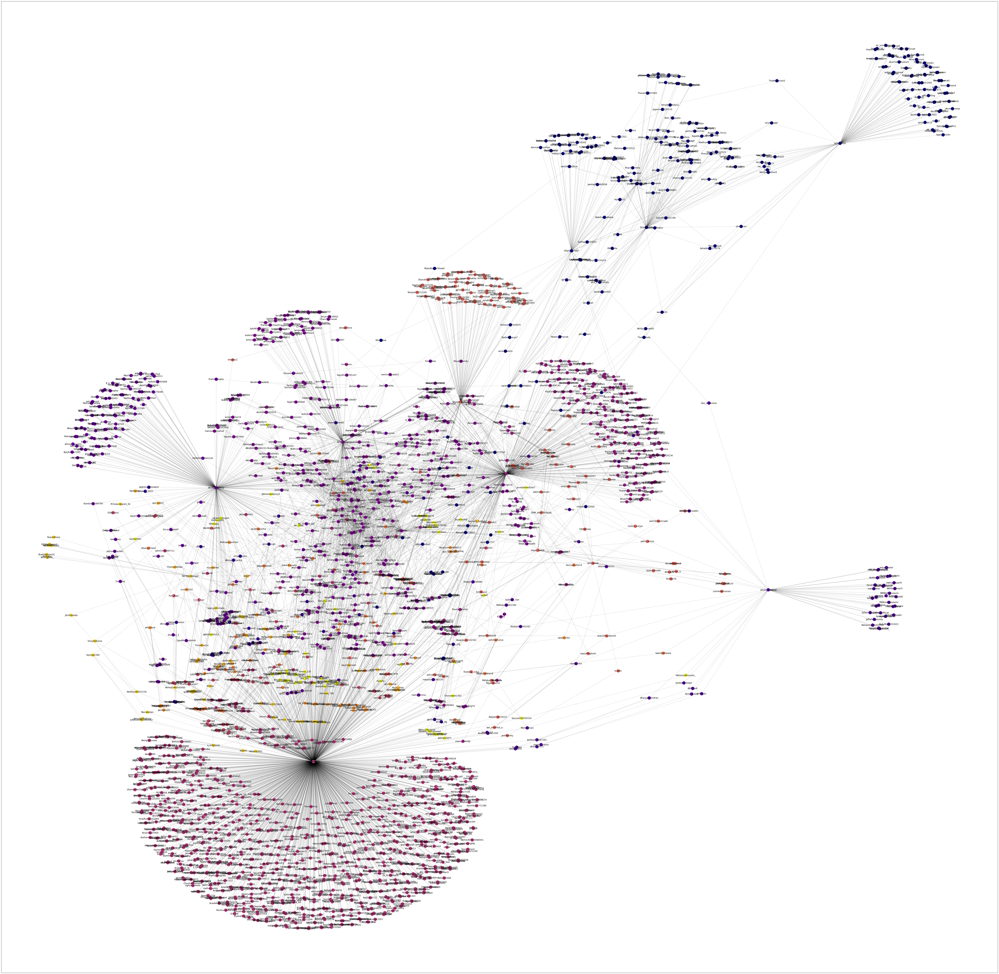

In [27]:
#communities
G = g.to_undirected()

#first compute the best partition
partition = community_louvain.best_partition(G)
print(community_louvain.modularity(partition, G))

# draw the graph
pos = nx.spring_layout(G)
# color the nodes according to their partition
plt.subplots(figsize =(100, 100))
cmap = cm.get_cmap('plasma', max(partition.values()) + 1)
nx.draw_networkx_nodes(G, pos, partition.keys(),
                       cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G, pos, alpha=0.2)
#labels = nx.draw_networkx_labels(G, pos)
plt.savefig('./retweet_network_communities_without_labels.png')

In [23]:
print("Number of communities: ", max(partition.values()) + 1)

Number of communities:  13


In [24]:
community_dict = {}

for key in partition.keys():
    if(partition[key] not in community_dict.keys()):
        community_dict[partition[key]] = [key]
    else:
        community_dict[partition[key]].append(key)
            

In [25]:
for key in community_dict.keys():
    print("Community: ", key)
    print("Members: ", community_dict[key])
    print("\n------------------------------------\n")

Community:  0
Members:  ['BJP4Bengal', 'BJP4India', 'JPNadda', 'AmitShah', 'narendramodi', 'PiyushGoyal', 'SuPriyoBabul', 'DilipGhoshBJP', 'amitmalviya', 'PMOIndia', 'AmitShahOffice', 'SuvenduWB', 'RajuBistaBJP', 'blsanthosh', 'airnewsalerts', 'TV9Bharatvarsh', 'DebasreeBJP', 'DilipGhoshOff', 'IndiaToday', 'pcsarangi', 'jankibaat1', 'KhanSaumitra', 'Paayel_12353', 'IndiaTVHindi', 'MirrorNow', 'CNBC_Awaaz', 'TezChannel', 'republic', 'OfficeofJPNadda', 'jdhankhar1', 'kalyanchaubey', 'anirbanganguly', 'Yash_Dasgupta', 'NisithPramanik', 'dushyanttgautam', 'hiran_chatterji', 'dpradhanbjp', 'KailashOnline', 'smritiirani', 'ANI', 'dindaashoke', 'MyAnandaBazar', 'tathagata2', 'Abhijit_Basak83', 'Indian000111', 'debudpg', '1ArijitD', 'DebjaniBhatta20', 'Subramaniam1082', 'mvmeet', 'AuschwitzMuseum', 'IamSourav_b', 'FireFly53647402', 'KrishanuBJP', 'NilotpalMukher6', 'Sisirkumardatt3', 'Rajibbagchi6', 'ShefVaidya', 'amitkbiswas', 'TimusIlluminati', 'SDigitalindian', 'Arijit4India', 'JasBJP', 'Ra

In [28]:
#plot degree distribution
def plot_deg_dist(G, dist_type='in'):
    if(dist_type == 'in'):
        degrees = G.in_degree() # list of tuples [(node id, in degree)]
    else:
        degrees = G.out_degree()
    values = {}
    for tup in degrees:
        if(tup[1] in values.keys()):
            values[tup[1]]+=1
        else:
            values[tup[1]]=1
    values = dict(sorted(values.items(), key=lambda item: item[0]))
    print(values)
    vals = [key for key in values.keys()]
    #print(in_vals)
    hist = [values[key] for key in values.keys()]
    
    final_vals = [] # for making more interpretable plots
    final_hist = []
    for key in values.keys():
        if(values[key] > 1 and key != 0):
            final_vals.append(key)
            final_hist.append(values[key])
            
    plt.figure() # you need to first do 'import pylab as plt' plt.grid(True)
    plt.plot(final_vals, final_hist) # in-degree plt.plot(out_values, out_hist, 'bv-') # out-degree plt.legend(['In-degree', 'Out-degree']) plt.xlabel('Degree')
    plt.ylabel('Number of nodes')
    plt.xlabel('Degree')
    if(dist_type == 'in'):
        plt.title('Retweet Network : In-degree distribution') 
        plt.savefig('./retweet_net_in_degree_distribution_final.png')
    else:
        plt.title('Retweet Network Network : Out-degree distribution')
        plt.savefig('./retweet_net_out_degree_distribution_final.png')

    plt.close()

In [29]:
#plot in-degree distribution
plot_deg_dist(g)
#plot out-degree distribution
plot_deg_dist(g, 'out')

{0: 2195, 1: 165, 2: 49, 3: 27, 4: 17, 5: 16, 6: 11, 7: 9, 8: 6, 9: 3, 10: 8, 11: 6, 12: 3, 13: 1, 14: 2, 15: 3, 16: 4, 17: 3, 18: 4, 19: 1, 20: 4, 21: 1, 22: 2, 23: 4, 24: 1, 25: 3, 26: 1, 28: 3, 29: 2, 30: 1, 33: 1, 36: 1, 39: 1, 40: 1, 45: 1, 49: 1, 58: 1, 70: 1, 126: 1, 178: 1, 215: 1, 392: 1, 1417: 1}
{0: 300, 1: 1361, 2: 579, 3: 179, 4: 59, 5: 23, 6: 12, 7: 10, 8: 7, 9: 4, 10: 6, 11: 4, 12: 5, 13: 2, 15: 2, 18: 2, 19: 2, 21: 1, 24: 2, 25: 1, 27: 1, 29: 1, 30: 1, 40: 1, 70: 1, 87: 1, 90: 1}


In [30]:
#Centrality measures
bet_cen = nx.betweenness_centrality(g)
clos_cen = nx.closeness_centrality(g)
eig_cen = nx.eigenvector_centrality(g, max_iter=200)
deg_cen = nx.degree_centrality(g)

def get_top_keys(dictionary, top):
    items = dictionary.items()
    items = sorted(items, reverse=True, key=lambda x: x[1]) 
    return map(lambda x: x[0], items[:top])

top_bet_cen = get_top_keys(bet_cen,10) 
top_clo_cen = get_top_keys(clos_cen,10) 
top_eig_cen = get_top_keys(eig_cen,10)
top_deg_cen = get_top_keys(deg_cen,10)

print("Top 10 Central Nodes: Degree centrality")
for node_id in top_deg_cen:
     print(node_id)
print('-----------------------------------------------')
print("Top 10 Central Nodes: Betweenness centrality")
for node_id in top_bet_cen:
     print(node_id)
print('-----------------------------------------------')
print("Top 10 Central Nodes: Closeness centrality")
for node_id in top_clo_cen:
     print(node_id)
print('-----------------------------------------------')
print("Top 10 Central Nodes: Eigen Vector centrality")
for node_id in top_eig_cen:
     print(node_id)

Top 10 Central Nodes: Degree centrality
MahuaMoitra
MamataOfficial
derekobrienmp
AITCofficial
SitaramYechury
DidiKeBolo
tathagata2
SuvenduWB
DilipGhoshBJP
aimim_national
-----------------------------------------------
Top 10 Central Nodes: Betweenness centrality
derekobrienmp
AITCofficial
DidiKeBolo
MahuaMoitra
MamataOfficial
DilipGhoshBJP
BJP4Bengal
SuvenduWB
aimim_national
abhishekaitc
-----------------------------------------------
Top 10 Central Nodes: Closeness centrality
MahuaMoitra
MamataOfficial
ANI
ndtv
kunalkamra88
BrutIndia
VTankha
frontline_india
ThePrintIndia
HomeBengal
-----------------------------------------------
Top 10 Central Nodes: Eigen Vector centrality
aimim_national
ANI
Zee_Hindustan
aajtak
CNNnews18
AimimZuber
asadowaisi
syedasimwaqar
MIRZARahmathBa6
MIMBahadurpura


In [31]:
#Clustering coefficient
print("Average Clustering Coefficient: ", nx.average_clustering(g))

Average Clustering Coefficient:  0.06417462208439596


In [32]:
print("Degree Assortativity Coefficient: ", nx.degree_assortativity_coefficient(g))

Degree Assortativity Coefficient:  -0.2955376568301077


### VoteRank
Select a list of influential nodes in a graph using VoteRank algorithm

VoteRankcomputes a ranking of the nodes in a graph G based on a voting scheme. With VoteRank, all nodes vote for each of its in-neighbours and the node with the highest votes is elected iteratively. The voting ability of out-neighbors of elected nodes is decreased in subsequent turns.

Zhang, J.-X. et al. (2016). Identifying a set of influential spreaders in complex networks. Sci. Rep. 6, 27823; doi: 10.1038/srep27823.

In [33]:
print("VoteRank: ", nx.voterank(g, number_of_nodes=None))

VoteRank:  ['tathagata2', 'derekobrienmp', 'DidiKeBolo', 'aimim_national', 'Sujan_Speak', 'DilipGhoshBJP', 'INCWestBengal', 'cpimspeak', 'SuvenduWB', 'Subhasi83803995', 'BJP4Bengal', 'subhajitdas2co1', 'MahuaMoitra', 'nilasishkar_jio', 'KushalKundu9', 'GopalPa17902196', 'IRFANNKPCC', 'madhulina10', 'ashish_bhunia', 'BAtamnirbhar', 'dhirajbhasin2', 'Saurabh59555321', 'SethLalits', 'satirist_indian', 'SarfarazAlamInd', 'SyedMoinuddin06', 'MLASabina', 'sentsumanu', '_Krishna12', '18AKGOYAL', 'SouravDindaBJP', 'BadhanDutta10', 'ShivajiBhattac7', 'Prasant49947904', 'MohdFursan', 'notifysunil', 'AbhrajitDutta6', 'SauravD16550316', 'NeelDas83815238', 'MamataOfficial', 'cthayyilyahooc2', '_shamim7', 'sahana2802', 'muzaffar2017', 'dammpunk', 'Priya120880', 'Javedahmed2407', 'Somenat63100167', 'Iftequa91072512', 'ansary_suja', 'ainershashon', 'helpless_indian', 'Aadil70491449', 'JeetKum14667181', 'kp_amit04', 'gautgunjan', 'spirit_of_venom', 'bazinga7Sheldon', 'poloRamky', 'SekarRathin', 'tanvee

In [34]:
pagerank_dict = nx.pagerank(g, alpha=0.9)
pagerank_dict = dict( sorted(pagerank_dict.items(), key=operator.itemgetter(1),reverse=True))
print("PageRank: ", pagerank_dict)

PageRank:  {'MahuaMoitra': 0.15816041494935443, 'MamataOfficial': 0.06156879960928052, 'kunalkamra88': 0.020086607676270917, 'derekobrienmp': 0.020083628954352506, 'ndtv': 0.019839766627362074, 'ANI': 0.019038365021069155, 'BrutIndia': 0.01812400079919253, 'ThePrintIndia': 0.01798381459368693, 'VTankha': 0.017972132409894797, 'frontline_india': 0.01787218483745099, 'AITCofficial': 0.015412154343584603, 'HomeBengal': 0.015047303069091238, 'CMOfficeWB': 0.014361057404679778, 'WBPolice': 0.014120035507494709, 'CPKolkata': 0.014061993499601159, 'SitaramYechury': 0.013791002370512976, 'PTI_News': 0.007000372926659097, 'SuvenduWB': 0.00696293249967096, 'CPIM_WESTBENGAL': 0.006610334161685269, 'BJP4Bengal': 0.0058442074273496675, 'aimim_national': 0.005683602241469172, 'DilipGhoshBJP': 0.004538808219200251, 'DidiKeBolo': 0.003785740034419741, 'RahulGandhi': 0.0035519951655110524, 'BanglarGorboMB': 0.0026582670451724606, 'narendramodi': 0.0024585214101242297, 'cpimspeak': 0.0019929629589522206

In [35]:
#top-k page ranks
k = 20
count = 0
print("Top",k,"PageRanks: \n")
for key in pagerank_dict.keys():
    print(key)
    if count == k:
        break
    count+=1

Top 20 PageRanks: 

MahuaMoitra
MamataOfficial
kunalkamra88
derekobrienmp
ndtv
ANI
BrutIndia
ThePrintIndia
VTankha
frontline_india
AITCofficial
HomeBengal
CMOfficeWB
WBPolice
CPKolkata
SitaramYechury
PTI_News
SuvenduWB
CPIM_WESTBENGAL
BJP4Bengal
aimim_national


In [ ]:
import networkx.algorithms.community.centrality as comm
import itertools
comp = comm.girvan_newman(g)
for communities in itertools.islice(comp, k):
    print("k: ", k)
    print("Number of communities, ", len(communities))
    print(tuple(sorted(c) for c in communities))
    print("\n--------------------------------\n")

k:  20
Number of communities,  2
(['1ArijitD', '399Roy', 'AB_JayHind', 'ANIRBAN60273768', 'ASHISH52754135', 'AbhaMistri', 'Abhijit_Basak83', 'Abhishe39297530', 'AbulKal63743048', 'AloPal', 'AmitShah', 'AmitShahOffice', 'AnantaR38998326', 'AnjanaPaira', 'AriSanjit', 'Arijit4India', 'ArunDawn5', 'AshokKu58740478', 'AtharvaForum', 'AuschwitzMuseum', 'BJP4Assam', 'BJP4Bengal', 'BJP4India', 'BadalAcharya7', 'BadhanDutta10', 'Bajrang10998328', 'BananiD43869922', 'BigBongTheory', 'BjpLokenath', 'Buddhad58746461', 'BuddhadebGhora1', 'Bunibroto', 'Bunny_I_', 'CDMsays', 'CNBC_Awaaz', 'ChandraBor', 'Debabra33261079', 'Debasis57575540', 'DebasreeBJP', 'DebduttaMonda11', 'DebjaniBhatta20', 'DebsharmaNabai', 'Debu30335133', 'DilipGhoshBJP', 'DilipGhoshOff', 'DilipKu46650262', 'DindaSabita', 'DipakOraw14', 'FilmmakerPartha', 'FireFly53647402', 'GOBINDA02904938', 'GOUTAMD33290327', 'GopalPa17902196', 'HLKodo', 'HajaAbuBucker', 'HinduarmysUnity', 'IamSourav_b', 'IndiaTVHindi', 'Indian000111', 'Indrajit

k:  20
Number of communities,  3
(['1ArijitD', '399Roy', 'AB_JayHind', 'ANIRBAN60273768', 'ASHISH52754135', 'AbhaMistri', 'Abhijit_Basak83', 'Abhishe39297530', 'AbulKal63743048', 'AloPal', 'AmitShah', 'AmitShahOffice', 'AnantaR38998326', 'AnjanaPaira', 'AriSanjit', 'Arijit4India', 'ArunDawn5', 'AshokKu58740478', 'AtharvaForum', 'AuschwitzMuseum', 'BJP4Assam', 'BJP4Bengal', 'BJP4India', 'BadalAcharya7', 'BadhanDutta10', 'Bajrang10998328', 'BananiD43869922', 'BigBongTheory', 'BjpLokenath', 'Buddhad58746461', 'BuddhadebGhora1', 'Bunibroto', 'Bunny_I_', 'CDMsays', 'CNBC_Awaaz', 'ChandraBor', 'Debabra33261079', 'Debasis57575540', 'DebasreeBJP', 'DebduttaMonda11', 'DebjaniBhatta20', 'DebsharmaNabai', 'Debu30335133', 'DilipGhoshBJP', 'DilipGhoshOff', 'DilipKu46650262', 'DindaSabita', 'DipakOraw14', 'FilmmakerPartha', 'FireFly53647402', 'GOBINDA02904938', 'GOUTAMD33290327', 'GopalPa17902196', 'HLKodo', 'HajaAbuBucker', 'HinduarmysUnity', 'IamSourav_b', 'IndiaTVHindi', 'Indian000111', 'Indrajit